In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from skimage import io
import skimage
from skimage import img_as_float
import glob
#First of all we are going to define some functions that will be helpful
#Support function that visualizes a figure with the images in the imagesList
def visualizeN(imagesList, nRows, nColumns, grayScale=True, titles=[],figSize=None):  
    hasTitles = len(titles) >= len(imagesList)
    if(figSize == None):
        figSize=(2*nColumns+5, 2*nRows+5)
    fig=plt.figure(figsize=figSize)   
    for i in range (1,len(imagesList)+1):
            fig.add_subplot(nRows,nColumns,i)
            if grayScale:
                plt.imshow(imagesList[i-1], cmap='gray')
            else:
                plt.imshow(imagesList[i-1])
            if hasTitles: 
                plt.title(titles[i-1])
            plt.xticks([])
            plt.yticks([])
    plt.show()

def vis1(image,figSize=(20,20)):
    visualizeN([image],1,1,figSize=figSize)


In [4]:
def cargarImages(path,first=0,step=1,last=-1):
  
  paths = glob.glob(path+"*.tiff")
  #Ens serveix per carregar les imatges en ordre.
  if(last == -1):
    last = len(paths)
  paths.sort()
  images = []
  for i in range(first,last,step):
    im = img_as_float(io.imread(paths[i],plugin='tifffile'))
    #im = cv.cvtColor(im, cv.COLOR_RGB2GRAY)
    images.append(im)
  #images = io.ImageCollection(path+"*.tiff")

  return images



def visOrderedImages(totalImages, vis=True):
  ordered = []
  holos = []
  for i in range(len(totalImages[0])):
    holos.append((totalImages[1][i])-(totalImages[0][i]))
    if vis:
      ordered.append(totalImages[0][i])
      ordered.append(totalImages[1][i])
      ordered.append(totalImages[0][i]-totalImages[1][i])
      ordered.append(totalImages[1][i]-totalImages[0][i])
  if vis:
    visualizeN(ordered,61,4)
  return holos


In [5]:
totalImages = []
totalImages.append(cargarImages("../ImagesOutput/Test_2022_07_28/Fondos/"))
totalImages.append(cargarImages("../ImagesOutput/Test_2022_07_28/Muestras/"))
#Printing len of images to know they have been loaded.
print("muestras:",len(totalImages[0]),"fondos:",len(totalImages[1]))

muestras: 100 fondos: 209


In [6]:
holos = visOrderedImages(totalImages,vis=False)
holosSmall = [skimage.transform.rescale(holo,0.5) for holo in holos]

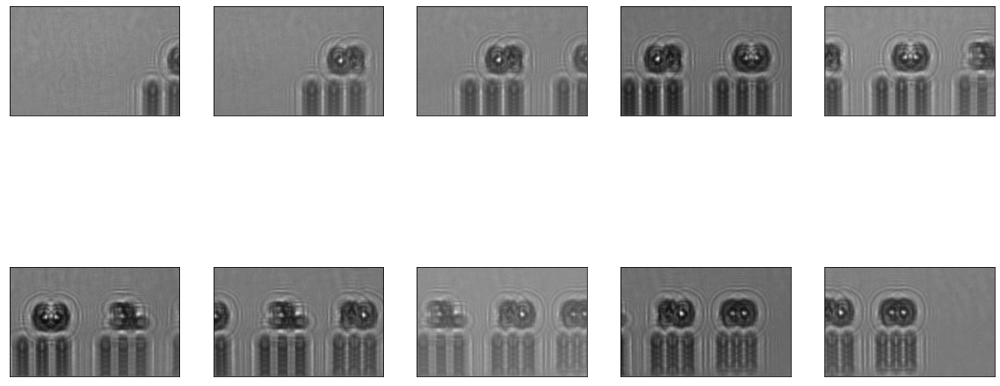

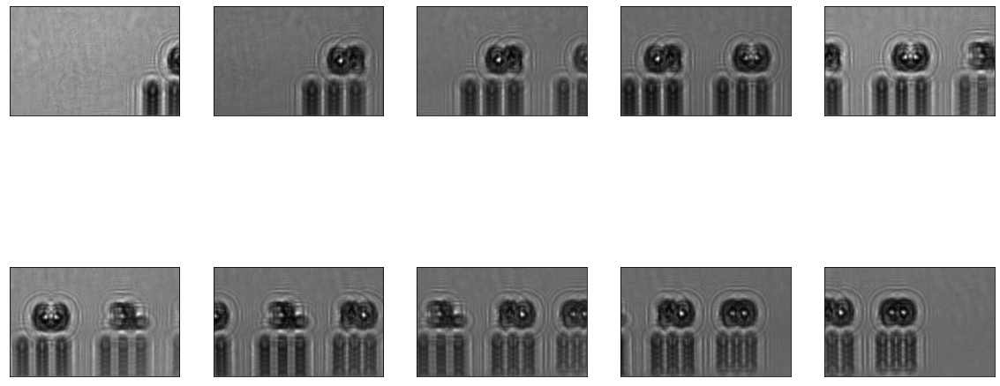

In [7]:
#Prove of holos
visualizeN(holos[:10],2,5,figSize=(20,10))
visualizeN(holosSmall[:10],2,5,figSize=(20,10))

In [8]:

#Extracting sift features.
def extract_sift_features(img):
    #Normalizing image
    img = nsift(img)
    #Creating sift
    sift = cv.SIFT.create(nfeatures=50, sigma=1.3)
    #Detecting and computing sift
    kp, des = sift.detectAndCompute(img,None)
    #Return kp and descriptor of the image.
    return kp, des

"""
Sift process of 2 images where "opt" = good filter of matches and "k" is a param for knn

Return ==> Good matches, (keypoints of image 1, keypoints of image 2),
(descriptors of image1 and descriptors of image2), (src_points, dst_pints)
"""
def siftProcess(img1,img2,opt=0.7,k=2):
    kp,d = extract_sift_features(img1)
    kp2,d2 = extract_sift_features(img2)

    bf = cv.BFMatcher()
    matches = bf.knnMatch(d,d2,k=k)

    good = []
    for m,n in matches:
        if m.distance < opt*n.distance:
            good.append([m])

    #src_pts = np.float32([ kp[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    #dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

    img3 = cv.drawMatchesKnn(nsift(img1),kp,nsift(img2),kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    vis1(img3)
    return good,(kp,kp2),(d,d2)#,(src_pts,dst_pts)
     
def nsift(img):
    #Normalizing image to use CV.
     return cv.normalize(img, None, 0, 255, cv.NORM_MINMAX).astype('uint8')

def torgb(input):
    #Normalize image
    images = [nsift(i) for i in input]
    #Stack on RGB images.
    images = [np.stack((img,)*3, axis=-1) for img in images]
    return images

import imutils
#Used to crop an image and take the central part of that. BASTANTE UTIL
def crop(image,correctiony=0,correctionx=0):
    image = cv.copyMakeBorder(image,5,5,5,5,cv.BORDER_CONSTANT,(0,0,0))

    gray = cv.cvtColor(image,cv.COLOR_BAYER_BG2GRAY)
    thresh = cv.threshold(gray,0,255,cv.THRESH_BINARY)[1]

    cnts = cv.findContours(thresh.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv.contourArea)
    mask = np.zeros(thresh.shape, dtype="uint8")
    (x,y,w,h) = cv.boundingRect(c)
    cv.rectangle(mask,(x,y),(x+w,y+h),255,-1)

    minRect = mask.copy()
    sub = mask.copy()

    while cv.countNonZero(sub) > 0:
        minRect = cv.erode(minRect,None)
        sub = cv.subtract(minRect, thresh)

    cnts = cv.findContours(minRect.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv.contourArea)
    (x,y,w,h) = cv.boundingRect(c)

    image = image[y-correctiony:y+h+correctiony, x-correctionx:x+w+correctionx]
    return image

def cropFree(image,x,w,y,h):
    image = image[y:y+h, x:x+w]
    return image


#Create Stitching
def createStitching(holos, vis=False, save=False,name="mostra"):

    #El stitcher necesita que se usen así las imagenes.
    holosFormated = [nsift(i) for i in holos]
    holosFormated3Channel = [np.stack((img,)*3, axis=-1) for img in holosFormated]

    stitcher = cv.Stitcher_create(mode=1)

    #stitcher. setExposureCompensator(cv.detail.EXPOSURE_COMPENSATOR_NO)
    (status, stitched) = stitcher.stitch(holosFormated3Channel)
    print(status)
    if(vis):
        visualizeN([stitched],1,1,figSize=(20,20))

    if(save):
        outputpath = "/home/labdis/projects/micProj/micProj/Notebooks/dataOutput/"
        io.imsave(outputpath+name+".tiff",stitched)
    
    return (status, stitched)
    

0


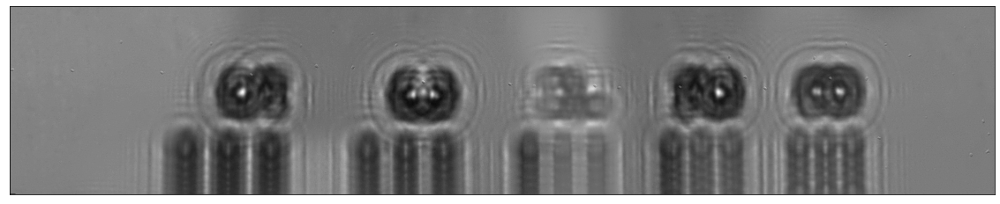

0


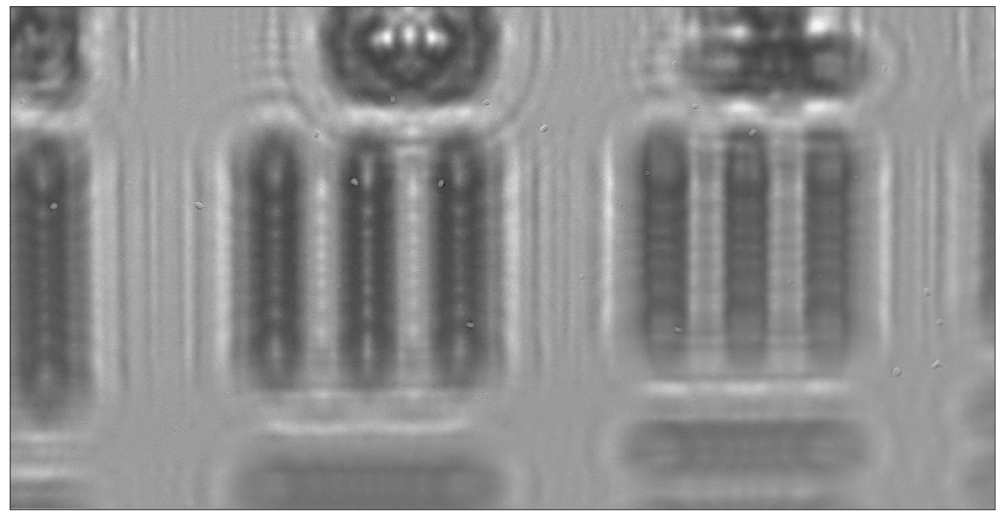

0


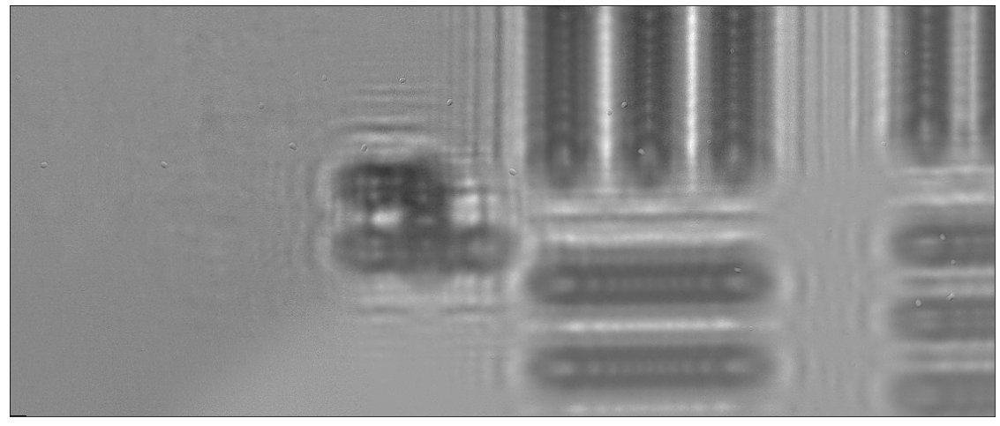

1


TypeError: 'NoneType' object is not subscriptable

In [9]:
full = []
croppedFull = []
totalSize = [0,0]
for i in range(6):
    newImage = createStitching(holos[0+10*i:10+10*i],vis=False,name=i)[1][:,:,0]
    cropped = crop(newImage)
    vis1(cropped)
    totalSize[0] += cropped.shape[0]
    totalSize[1] += cropped.shape[1]
    full.append(newImage)
    croppedFull.append(cropped)
    if False:
            outputpath = "../Notebooks/dataOutput/"
            io.imsave(outputpath+str(i)+".tiff",cropped)

https://es.scribd.com/document/510892625/Panorama-Stitching-P2

https://github.com/KEDIARAHUL135/PanoramaStitchingP2/blob/master/main.py

https://github.com/KEDIARAHUL135/PanoramaStitching/blob/master/main.py

In [10]:
MIN_MATCH_COUNT = 10

"""
Parameters
    "nfeatures"	The number of best features to retain. The features are ranked by their scores (measured in SIFT algorithm as the local contrast)
    "nOctaveLayers"	The number of layers in each octave. 3 is the value used in D. Lowe paper. The number of octaves is computed automatically from the image resolution.
    "contrastThreshold"	The contrast threshold used to filter out weak features in semi-uniform (low-contrast) regions. The larger the threshold, the less features are produced by the detector.

Note
    The contrast threshold will be divided by nOctaveLayers when the filtering is applied. When nOctaveLayers is set to default and if you want to use the value used in D. Lowe paper, 0.03, set this argument to 0.09.

Parameters
    "edgeThreshold"	The threshold used to filter out edge-like features. Note that the its meaning is different from the contrastThreshold, i.e. the larger the edgeThreshold, the less features are filtered out (more features are retained).
    "sigma"	The sigma of the Gaussian applied to the input image at the octave #0. If your image is captured with a weak camera with soft lenses, you might want to reduce the number. 
"""

def FindMatches(BaseImage, SecImage,detector=0, nfeatures=0, sigma=1.6,constrantThreshold=0.04,edgeTHreshold=10,nOctaveLayers=3, normalizeImage=False, bf=True, visMatches=False):
    # Using SIFT to find the keypoints and decriptors in the images
    if(detector == 0):
        Detector = cv.SIFT_create(nOctaveLayers=nOctaveLayers,contrastThreshold=0.04,edgeThreshold=10,nfeatures=nfeatures, sigma=sigma)
    elif(detector == 1):
        Detector = cv.BRISK_create()
    elif(detector == 2):
        Detector = cv.KAZE_create()
    elif(detector == 3):
        Detector = cv.MSER_create()
    if(normalizeImage):
        BaseImage_kp, BaseImage_des = Detector.detectAndCompute(cv.normalize(BaseImage, None, 0, 255, cv.NORM_MINMAX).astype('uint8'), None)
        SecImage_kp, SecImage_des = Detector.detectAndCompute(cv.normalize(SecImage, None, 0, 255, cv.NORM_MINMAX).astype('uint8'), None)
    else:
        BaseImage_kp, BaseImage_des = Detector.detectAndCompute(cv.cvtColor(BaseImage, cv.COLOR_BGR2GRAY), None)
        SecImage_kp, SecImage_des = Detector.detectAndCompute(cv.cvtColor(SecImage, cv.COLOR_BGR2GRAY), None)

    if bf:
        # Using Brute Force matcher to find matches.
        BF_Matcher = cv.BFMatcher()
        InitialMatches = BF_Matcher.knnMatch(BaseImage_des, SecImage_des, k=2)
    else:
        FLANN_INDEX_KDTREE = 0
        index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
        search_params = dict(checks = 50)

        flann = cv.FlannBasedMatcher(index_params, search_params)

        InitialMatches = flann.knnMatch(BaseImage_des,SecImage_des,k=2)

    # Applying ratio test and filtering out the good matches.
    GoodMatches = []
    for m, n in InitialMatches:
        if m.distance < 0.75* n.distance:
            GoodMatches.append([m])
    
    if visMatches:
        img3 = cv.drawMatchesKnn(BaseImage,BaseImage_kp,SecImage,SecImage_kp,GoodMatches,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        vis1(img3)

    return GoodMatches, BaseImage_kp, SecImage_kp



def FindHomography(Matches, BaseImage_kp, SecImage_kp):
    # If less than min_match_count matches found, exit the code.
    
    if len(Matches) < MIN_MATCH_COUNT:
        print("\nNot enough matches found between the images.\n")
        return None, -2, None

    # Storing coordinates of points corresponding to the matches found in both the images
    BaseImage_pts = []
    SecImage_pts = []
    for Match in Matches:
        BaseImage_pts.append(BaseImage_kp[Match[0].queryIdx].pt)
        SecImage_pts.append(SecImage_kp[Match[0].trainIdx].pt)

    # Changing the datatype to "float32" for finding homography
    BaseImage_pts = np.float32(BaseImage_pts)
    SecImage_pts = np.float32(SecImage_pts)
    
    # Finding the homography matrix(transformation matrix).
    
    (HomographyMatrix, Status) = cv.findHomography(SecImage_pts, BaseImage_pts, cv.RANSAC, 4.0)
    
    #cv.findFundamentalMat()
    #cv.findEssentialMat()
    matchesMask = HomographyMatrix.ravel().tolist()

    return HomographyMatrix, Status, matchesMask

    
def GetNewFrameSizeAndMatrix(HomographyMatrix, Sec_ImageShape, Base_ImageShape):
    # Reading the size of the image
    (Height, Width) = Sec_ImageShape
    
    # Taking the matrix of initial coordinates of the corners of the secondary image
    # Stored in the following format: [[x1, x2, x3, x4], [y1, y2, y3, y4], [1, 1, 1, 1]]
    # Where (xi, yi) is the coordinate of the i th corner of the image. 
    InitialMatrix = np.array([[0, Width - 1, Width - 1, 0],
                              [0, 0, Height - 1, Height - 1],
                              [1, 1, 1, 1]])
    
    # Finding the final coordinates of the corners of the image after transformation.
    # NOTE: Here, the coordinates of the corners of the frame may go out of the 
    # frame(negative values). We will correct this afterwards by updating the 
    # homography matrix accordingly.
    
    # Gracias a esto sabemos donde se colocan los puntos de los extremos 
    # de la imagen 2 segun la holografia que se ha creado.
    ###print("initialmat",InitialMatrix,"homomat" ,HomographyMatrix, "\n")
    FinalMatrix = np.dot(HomographyMatrix, InitialMatrix)

    [x, y, c] = FinalMatrix
    x = np.divide(x, c)
    y = np.divide(y, c)
    ###print("finalMatrix",FinalMatrix, "x",x,"y",y,"c",c, "\n")
    # Finding the dimentions of the stitched image frame and the "Correction" factor
    min_x, max_x = int(round(min(x))), int(round(max(x)))
    min_y, max_y = int(round(min(y))), int(round(max(y)))

    New_Width = max_x
    New_Height = max_y
    Correction = [0, 0]
    if min_x < 0:
        New_Width -= min_x
        Correction[0] = abs(min_x)
    if min_y < 0:
        New_Height -= min_y
        Correction[1] = abs(min_y)
    
    ###print("correction",Correction,"\n")
    # Again correcting New_Width and New_Height
    # Helpful when secondary image is overlaped on the left hand side of the Base image.
    if New_Width < Base_ImageShape[1] + Correction[0]:
        New_Width = Base_ImageShape[1] + Correction[0]
    if New_Height < Base_ImageShape[0] + Correction[1]:
        New_Height = Base_ImageShape[0] + Correction[1]

    # Finding the coordinates of the corners of the image if they all were within the frame.
    x = np.add(x, Correction[0])
    y = np.add(y, Correction[1])
    OldInitialPoints = np.float32([[0, 0],
                                   [Width - 1, 0],
                                   [Width - 1, Height - 1],
                                   [0, Height - 1]])
    NewFinalPonts = np.float32(np.array([x, y]).transpose())

    # Updating the homography matrix. Done so that now the secondary image completely 
    # lies inside the frame
    HomographyMatrix = cv.getPerspectiveTransform(OldInitialPoints, NewFinalPonts)
    ###print("oldpoints",OldInitialPoints,"finalpoints",NewFinalPonts,"finalhomo",HomographyMatrix)

    return [New_Height, New_Width], Correction, HomographyMatrix



def StitchImages(BaseImage, SecImage,detector=0,bf=False,visMatches=False):
    # Finding matches between the 2 images and their keypoints
    Matches, BaseImage_kp, SecImage_kp = FindMatches(BaseImage, SecImage,detector=detector,bf=bf,visMatches=visMatches)
    
    # Finding homography matrix.
    HomographyMatrix, Status, matchesMask = FindHomography(Matches, BaseImage_kp, SecImage_kp)

    
    # Finding size of new frame of stitched images and updating the homography matrix 
    NewFrameSize, Correction, HomographyMatrix = GetNewFrameSizeAndMatrix(HomographyMatrix, SecImage.shape[:2], BaseImage.shape[:2])

    # Finally placing the images upon one another.
    StitchedImage = cv.warpPerspective(SecImage, HomographyMatrix, (NewFrameSize[1], NewFrameSize[0]))
    StitchedImage[Correction[1]:Correction[1]+BaseImage.shape[0], Correction[0]:Correction[0]+BaseImage.shape[1]] = BaseImage

    return StitchedImage


def FindAffineTransform(Matches, BaseImage_kp, SecImage_kp):

    if len(Matches) < MIN_MATCH_COUNT:
        print("\nNot enough matches found between the images.\n")
        return None, -2, None

    # Storing coordinates of points corresponding to the matches found in both the images
    BaseImage_pts = []
    SecImage_pts = []
    for Match in Matches:
        BaseImage_pts.append(BaseImage_kp[Match[0].queryIdx].pt)
        SecImage_pts.append(SecImage_kp[Match[0].trainIdx].pt)

    # Changing the datatype to "float32" for finding homography
    BaseImage_pts = np.float32(BaseImage_pts)
    SecImage_pts = np.float32(SecImage_pts)
    
    # Finding the homography matrix(transformation matrix).
    print(type(BaseImage_pts))
    affineTransform = cv.getAffineTransform(BaseImage_pts[0:3],SecImage_pts[0:3])

    return affineTransform

#def GetNewFrameSizeAndMatrixAffine(affineTransform,Sec_ImageShape, Base_ImageShape):


def StitchImagesAffine(BaseImage, SecImage,detector=0,bf=False,visMatches=False):
    # Finding matches between the 2 images and their keypoints
    Matches, BaseImage_kp, SecImage_kp = FindMatches(BaseImage, SecImage,detector=detector,bf=bf,visMatches=visMatches)
    
    # Finding homography matrix.
    #HomographyMatrix, Status, matchesMask = FindHomography(Matches, BaseImage_kp, SecImage_kp)
    affineTransform = FindAffineTransform(Matches,BaseImage_kp,SecImage_kp)
    
    # Finding size of new frame of stitched images and updating the homography matrix 
    NewFrameSize, Correction, affineTransform = GetNewFrameSizeAndMatrix(affineTransform, SecImage.shape[:2], BaseImage.shape[:2])

    # Finally placing the images upon one another.
    StitchedImage = cv.warpPerspective(SecImage, affineTransform, (NewFrameSize[1], NewFrameSize[0]))
    StitchedImage[Correction[1]:Correction[1]+BaseImage.shape[0], Correction[0]:Correction[0]+BaseImage.shape[1]] = BaseImage

    return StitchedImage
   

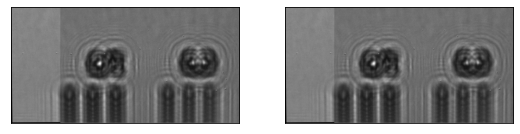

In [11]:
images = torgb(holos)
StitchedImage = StitchImages(images[3],images[2],detector=0,bf=True)
#StitchedImage = StitchImagesAffine(images[3],images[2],detector=0,bf=True)
StitchedImage2 = StitchImages(images[3],images[2],detector=0,bf=False)

# Displaying the stitched images.
visualizeN([StitchedImage,StitchedImage2],1,2,(20,20))

In [122]:
from skimage.draw import rectangle_perimeter
def overlap(im1, im2, dy, dx, vis=False, rectangles=False, crop = False):
    #punts inicialsde les imatges
    x1 = max(-dx, 0)
    y1 = max(-dy, 0)
    x2 = max(dx, 0)
    y2 = max(dy, 0)

    #dimensoins de les imatges
    h1, w1 = im1.shape
    h2, w2 = im2.shape

    #dimensions de la imatge final
    h = max(y1 + h1, y2 + h2)
    w = max(x1 + w1, x2 + w2)

    #principi i final del operlap
    oStartY = max(y1, y2)
    oStartX = max(x1, x2)
    oEndY = min(y1 + h1, y2 + h2)
    oEndX = min(x1 + w1, x2 + w2)

    imFinal = np.zeros((h, w), dtype=float)
    imFinal[y1:y1+h1, x1:x1+w1] = im1 #+= si descomentamos abajo
    imFinal[y2:y2+h2, x2:x2+w2] = im2 #+= si descomentamos abajo

    if rectangles:
        rr, cc = rectangle_perimeter((2,oEndX),(oStartY,imFinal.shape[1]-2))
        rr1, cc1 = rectangle_perimeter((oEndY,2),(imFinal.shape[0]-2,oStartX))
        imFinal[rr,cc] = 1
        imFinal[rr1,cc1] = 1

    if vis:
        siftProcess(im1,im2)
        visualizeN([im1,im2,imFinal],1,3,figSize=(40,80))

    if crop:
        image2 = imFinal[oStartY:oEndY,oStartX:oEndX]
        vis1(image2)
        
    return imFinal 



In [123]:
def overlapFila(im1, im2, dy, dx, vis=False,overlapedList=[]):
    #punts inicialsde les imatges
    x1 = max(-dx, 0)
    y1 = max(-dy, 0)
    x2 = max(dx, 0)
    y2 = max(dy, 0)

    #dimensoins de les imatges
    h1, w1 = im1.shape
    h2, w2 = im2.shape

    #dimensions de la imatge final
    h = max(y1 + h1, y2 + h2)
    w = max(x1 + w1, x2 + w2)

    #principi i final del operlap
    oStartY = max(y1, y2)
    oStartX = max(x1, x2)
    oEndY = min(y1 + h1, y2 + h2)
    oEndX = min(x1 + w1, x2 + w2)

    imFinal = np.zeros((h, w), dtype=float)
    imFinal[y1:y1+h1, x1:x1+w1] = im1 #+= si descomentamos abajo
    imFinal[y2:y2+h2, x2:x2+w2] = im2 #+= si descomentamos abajo

    if vis:
        siftProcess(im1,im2)
        visualizeN([im1,im2,imFinal],1,3,figSize=(40,80))
    
    overlapedList.append(((0,oEndX),(oStartY,imFinal.shape[1])))
        
    return imFinal,overlapedList

def overlapNextFila(im1, im2, dy, dx, overlapedList, vis=False):
    #punts inicialsde les imatges
    x1 = max(-dx, 0)
    y1 = max(-dy, 0)
    x2 = max(dx, 0)
    y2 = max(dy, 0)

    #dimensoins de les imatges
    h1, w1 = im1.shape
    h2, w2 = im2.shape

    #dimensions de la imatge final
    h = max(y1 + h1, y2 + h2)
    w = max(x1 + w1, x2 + w2)

    #principi i final del operlap
    oStartY = max(y1, y2)
    oStartX = max(x1, x2)
    oEndY = min(y1 + h1, y2 + h2)
    oEndX = min(x1 + w1, x2 + w2)

    imFinal = np.zeros((h, w), dtype=float)
    imFinal[y1:y1+h1, x1:x1+w1] = im1 #+= si descomentamos abajo
    imFinal[y2:y2+h2, x2:x2+w2] = im2 #+= si descomentamos abajo

    for i in overlapedList:
        imFinal[i[0][0]+dy : i[1][0]+dy, i[0][1]+dx : i[1][1]+dx] = im1[i[0][0]+dy : i[1][0]+dy, i[0][1]+dx : i[1][1]+dx]
    

    if vis:
        siftProcess(im1,im2)
        visualizeN([im1,im2,imFinal],1,3,figSize=(40,80))

    #overlapedList.append(((0,oEndX),(oStartY,imFinal.shape[1])))
        
    return imFinal

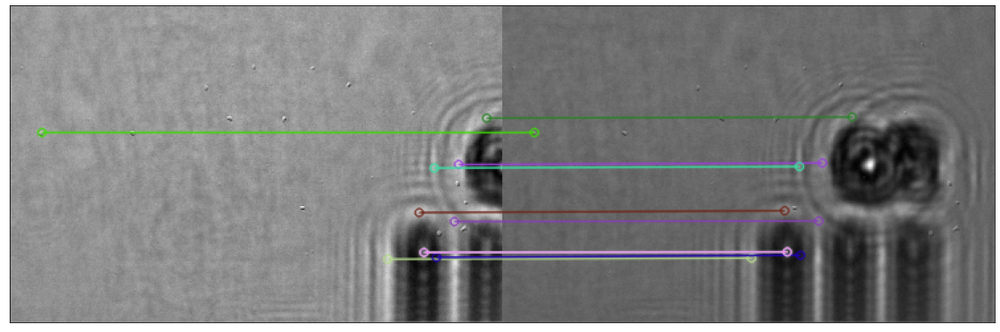

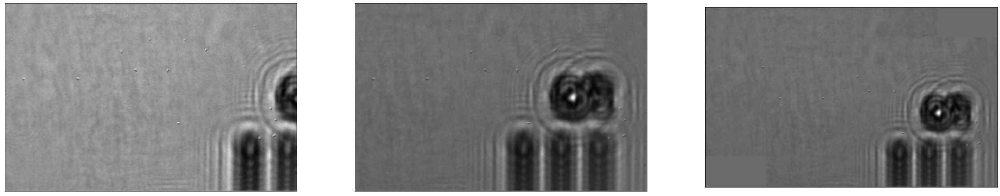

In [124]:
skere = overlap(holosSmall[0],holosSmall[1],50,97,vis=True)

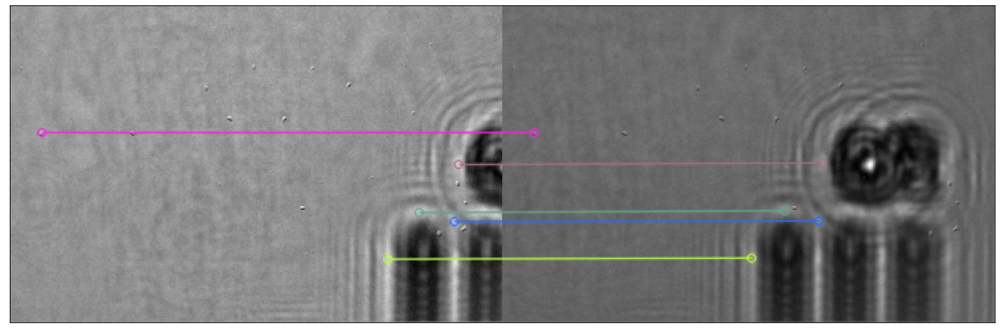

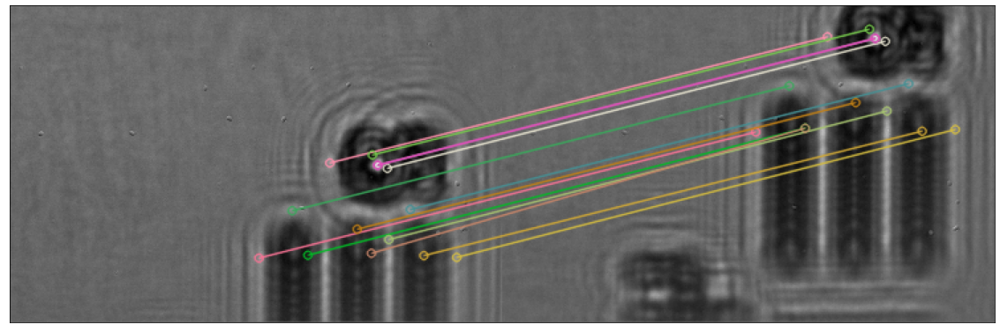

In [125]:
(good,kp,des) = siftProcess(holosSmall[0],holosSmall[1],opt=0.6)
(good2,kp2,des2) = siftProcess(holosSmall[1],holosSmall[11],opt=0.6)

In [126]:
src_pts = np.float32([ kp[0][m[0].queryIdx].pt for m in good ]).reshape(-1,1,2)
dst_pts = np.float32([ kp[1][m[0].trainIdx].pt for m in good ]).reshape(-1,1,2)

src_pts2 = np.float32([ kp2[0][m[0].queryIdx].pt for m in good2 ]).reshape(-1,1,2)
dst_pts2 = np.float32([ kp2[1][m[0].trainIdx].pt for m in good2 ]).reshape(-1,1,2)

In [127]:
dif_vect = np.array([src_pts[i][0] - dst_pts[i][0] for i in range(1,len(src_pts))])
dif_vect2 = np.array([src_pts2[i][0] - dst_pts2[i][0] for i in range(1,len(src_pts2))])

In [128]:
med = dif_vect.mean(axis=0)
med2 = dif_vect2.mean(axis=0)
print(med)
print(med2)

[96.839584   0.9820576]
[-0.5293492 95.68639  ]


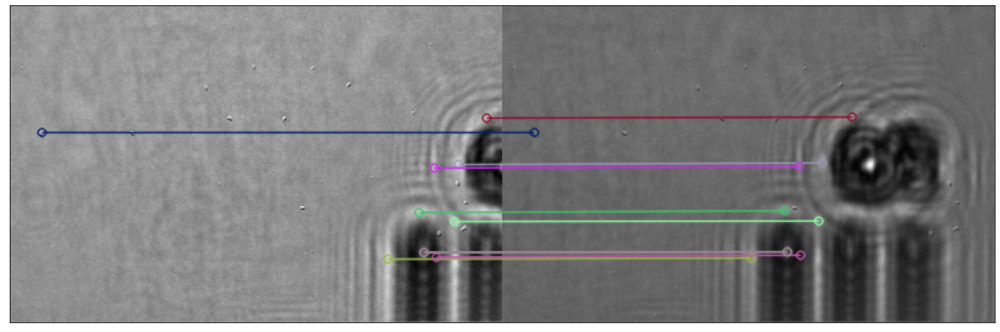

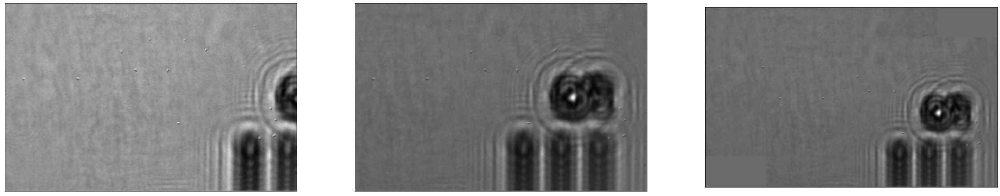

In [129]:
skere = overlap(holosSmall[0],holosSmall[1],50,97,vis=True)

In [130]:
"""def overlapTotal(images, ddy, ddx, nx, ny, vis):

    imFinal = images[0]

    for j in range(1,nx):
        
        imFinal = overlap(imFinal,images[j],j*ddx[1],j*ddx[0])

    if vis: 
        print("fila "+str(0))
        vis1(imFinal,figSize=(20,20))
        
    for i in range(1,ny):
        
        fila = images[i * ny]

        for j in range(1,nx):

            fila = overlap(fila,images[i*ny + j],j*ddx[1],j*ddx[0])
        
        imFinal = overlap(imFinal, fila, i*ddy[1], i*ddy[0])

        if vis:
            print("fila" + str(i))
            vis1(fila,figSize=(20,20))
            vis1(imFinal,figSize=(20,20))
    vis1(imFinal,figSize=(20,20))
    
    return imFinal
"""
def overlapTotal(images, ddy, ddx, nx, ny, vis):
    
    imFinal = images[0]

    overlappedList = []

    for j in range(1,nx):
        
        imFinal,overlappedList = overlapFila(imFinal,images[j],j*ddx[1],j*ddx[0],overlapedList=overlappedList)

    if vis: 

        print("fila "+str(0))

        vis1(imFinal,figSize=(20,20))
        
    for i in range(1,10):

        fila = images[i * ny]

        for j in range(1,nx):

            fila = overlap(fila, images[i*ny + j], j*ddx[1],j*ddx[0])
        
        imFinal = overlapNextFila(imFinal, fila, i*ddy[1], i*ddy[0], overlappedList)

        if vis:

            print("fila" + str(i))

            vis1(fila,figSize=(20,20))

            vis1(imFinal,figSize=(20,20))

    vis1(imFinal,figSize=(20,20))
    
    return imFinal

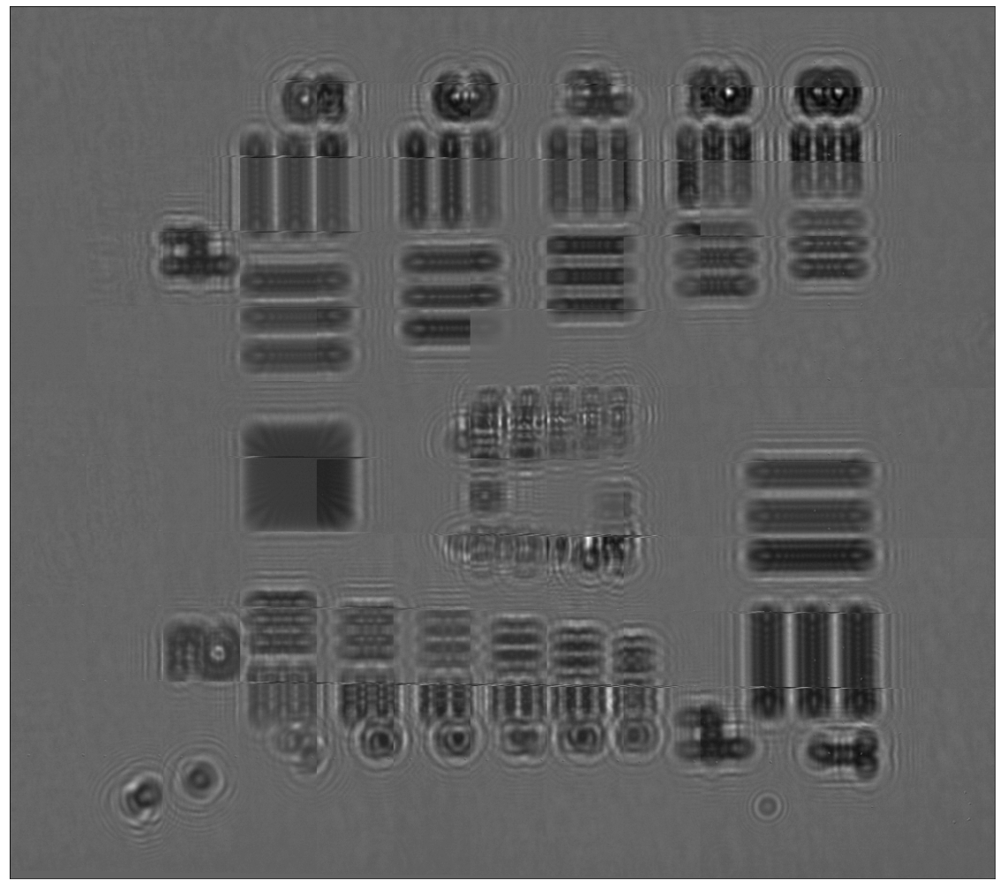

In [131]:
imFinal = overlapTotal(holosSmall,(0,95),(97,1),10,10,False)

**A partir de aquí, pruebas y resultados.**

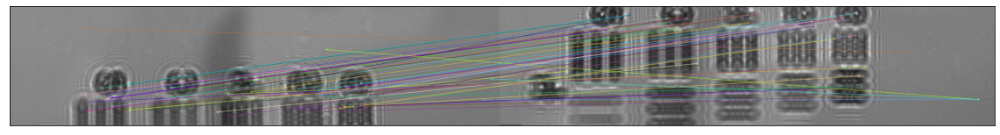

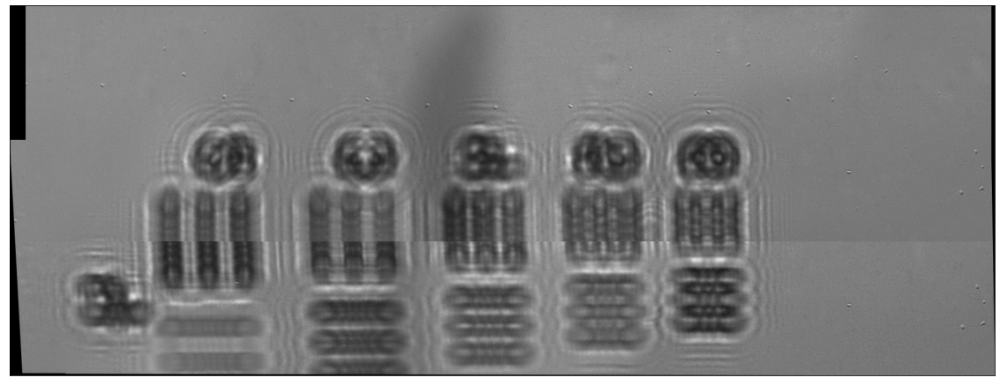

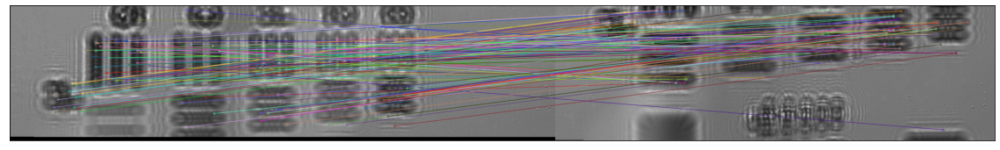

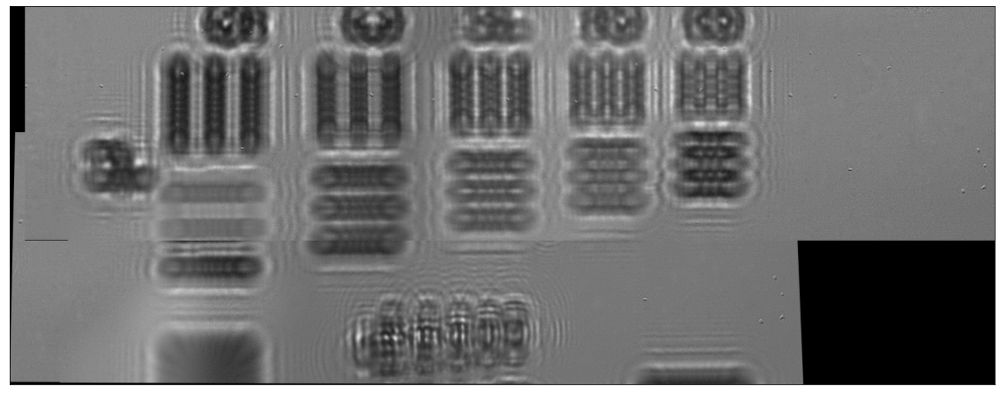

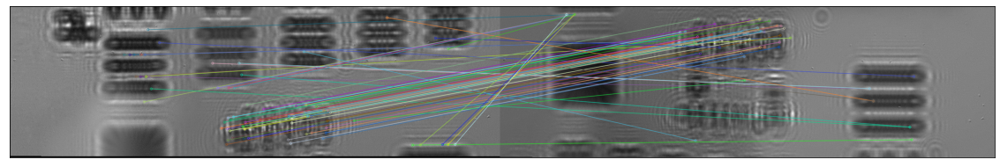

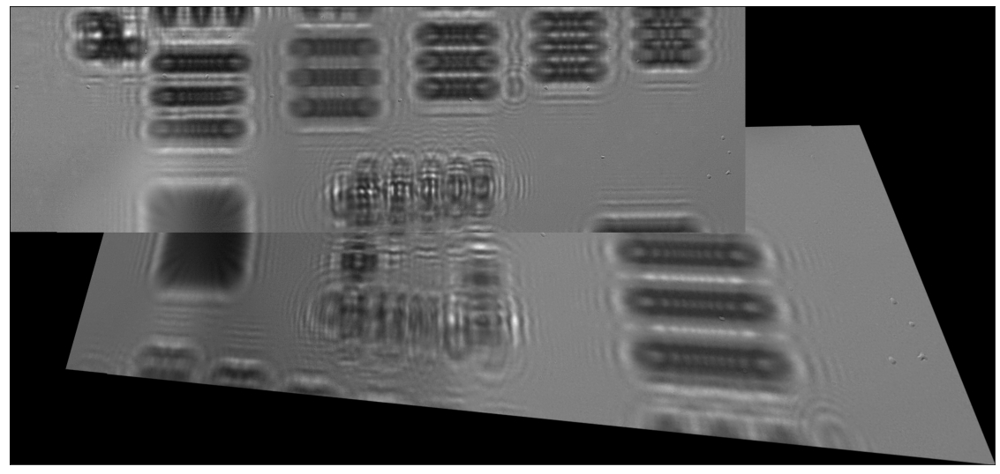

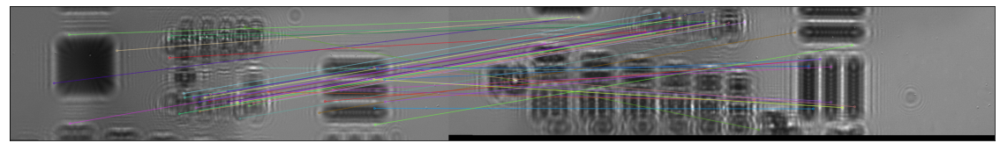

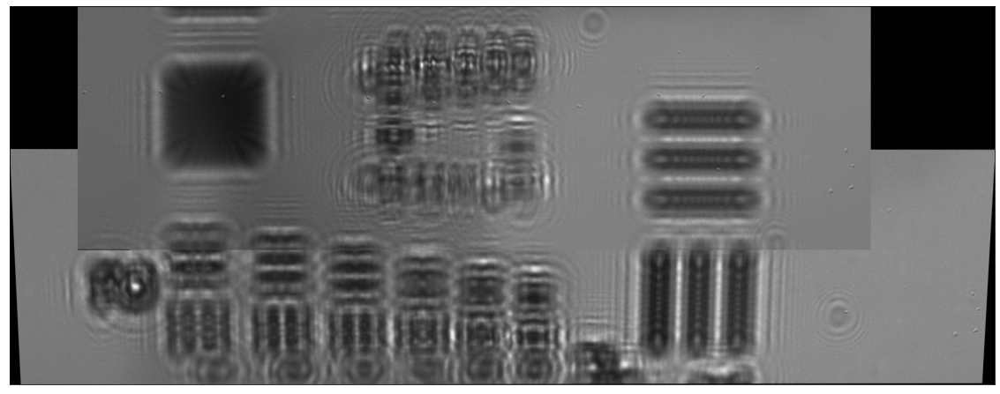

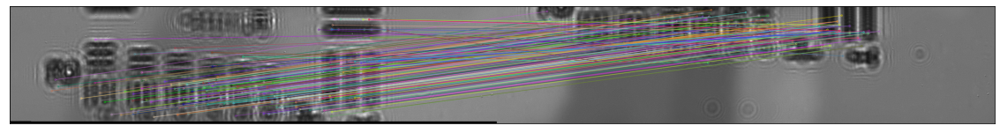

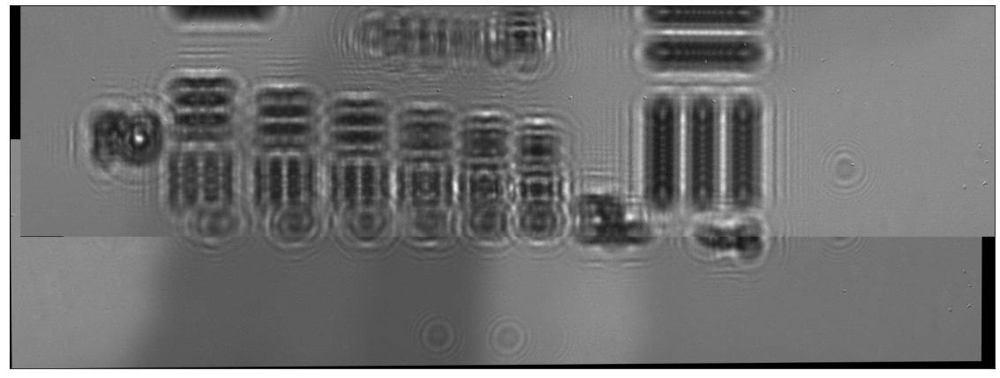

In [ ]:
imagedCropped = torgb(croppedFull)
for i in range(5):
    StitchedImage = StitchImages(imagedCropped[i],imagedCropped[i+1],detector=0,bf=False,visMatches=True)
    vis1(StitchedImage)

In [ ]:
def visRowStitchedNotCyl(list,img1,img2,vis=False,cropping=False,cropping2=False,correctiony = 0, correctionx = 0):
    StitchedImage = StitchImages(img1,img2)
    if(cropping):
            StitchedImage = crop(StitchedImage[:,:,0],correctiony=correctiony,correctionx=correctionx)
            StitchedImage = np.stack((StitchedImage,)*3, axis=-1)
    lista = list
    for i in lista:
        StitchedImage = StitchImages(StitchedImage,i)
        if(cropping):
            StitchedImage = crop(StitchedImage[:,:,0],correctiony=correctiony,correctionx=correctionx)
            StitchedImage = np.stack((StitchedImage,)*3, axis=-1)

    if(cropping2):
            StitchedImage = crop(StitchedImage[:,:,0],correctiony=correctiony,correctionx=correctionx)
            StitchedImage = np.stack((StitchedImage,)*3, axis=-1)
    if(vis):
        visualizeN([StitchedImage],1,1,figSize=(20,20))
    return StitchedImage



def visRowStitchedNotCyl2(list,img1,img2,vis=False,cropping=False,w = 0, h = 0):
    StitchedImage = StitchImages(img1,img2)
    if(cropping):
            shapeStitched = StitchedImage.shape
            StitchedImage = cropFree(StitchedImage[:,:,0],x=w,w=shapeStitched[0]-w,y=h,h=shapeStitched[1]-h)
            StitchedImage = np.stack((StitchedImage,)*3, axis=-1)
    lista = list
    for i in lista:
        StitchedImage = StitchImages(StitchedImage,i)
        if(cropping):
            shapeStitched = StitchedImage.shape
            StitchedImage = cropFree(StitchedImage[:,:,0],x=w,w=shapeStitched[0]-w,y=h,h=shapeStitched[1]-h)
            StitchedImage = np.stack((StitchedImage,)*3, axis=-1)
            
    if(vis):
        visualizeN([StitchedImage],1,1,figSize=(20,20))
    return StitchedImage


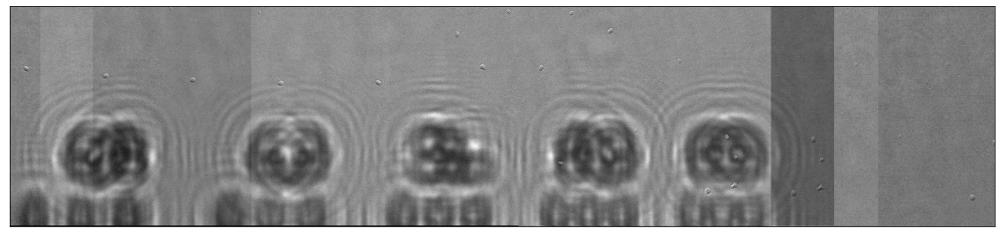

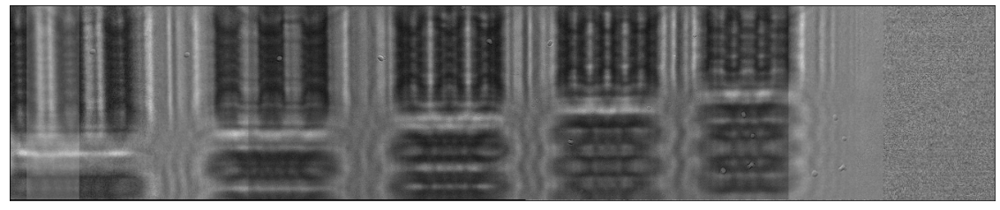

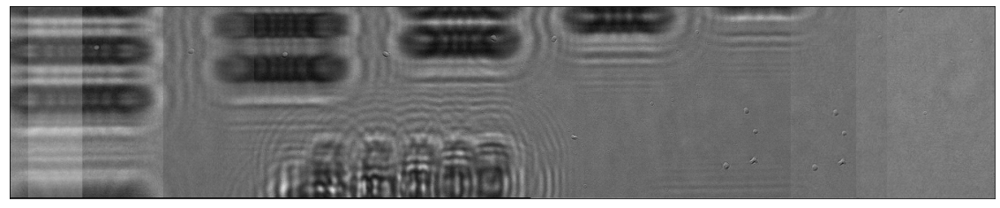

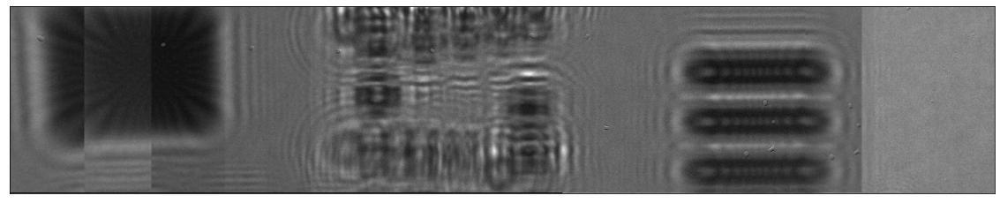

In [ ]:
def getListImagesRown(n):
    lista = [images[i+10*n] for i in [3,6,2,7,1,8]]
    return lista
def getListImagesOrdered():
    lista = [images[i] for i in [16,25,5,4,6,26,24]]
    return lista
#row1 = visRowStitchedNotCyl(getListImagesRown(0),images[5],images[4],vis=True, cropping=False,correctionx=0,correctiony=0)
#row1 = visRowStitchedNotCyl(getListImagesRown(3),images[35],images[34],vis=True, cropping=False,correctionx=0,correctiony=0)
row1 = visRowStitchedNotCyl(getListImagesRown(0),images[5],images[4],vis=True,cropping=True,correctionx=0,correctiony=0)
row1 = visRowStitchedNotCyl(getListImagesRown(1),images[15],images[14],vis=True,cropping=True,correctionx=0,correctiony=0)
row1 = visRowStitchedNotCyl(getListImagesRown(2),images[25],images[24],vis=True,cropping=True,correctionx=0,correctiony=0)
row1 = visRowStitchedNotCyl(getListImagesRown(3),images[35],images[34],vis=True,cropping=True,correctionx=0,correctiony=0)
#row1 = visRowStitchedNotCyl(getListImagesRown(0),images[5],images[4],vis=True,cropping=True,correctionx=0,correctiony=0)
#row1 = visRowStitchedNotCyl2(getListImagesOrdered(),images[15],images[14],vis=True,cropping=False,w=50,h=50)
#row1 = visRowStitchedNotCyl2(getListImagesOrdered(),images[15],images[14],vis=True,cropping=True,w=50,h=50)
#row1 = visRowStitchedNotCyl(getListImagesRown(1),images[5],images[4],vis=True,correctionx=0,correctiony=0)
#vis1(croppedFull[0])
#row1 = visRowStitchedNotCyl(getListImagesRown(0),images[5],images[4],vis=True, cropping=False,cropping2=True,correctionx=0,correctiony=0)
#row1 = visRowStitchedNotCyl(getListImagesRown(0),images[5],images[4],vis=True, cropping=True,correctionx=50,correctiony=50)
#row1 = visRowStitchedNotCyl(getListImagesRown(0),images[5],images[4],vis=True, cropping=True,correctionx=0,correctiony=00)
#row1 = visRowStitchedNotCyl(getListImagesRown(1),images[15],images[14],vis=True, cropping=True)
#row1 = visRowStitchedNotCyl(getListImagesRown(2),images[25],images[24],vis=True, cropping=True)

PARA HACE HACER AUMENTOS

- PIXEL ==> 6 MICRAS SIEMPRE
- USAF ==> IZQUIERDA GRUPO ARRIBA ELEM (MIRAR WIKI) (MIRAR MEDIDAS)
- 